# Images compression

Load and show images and import modules 

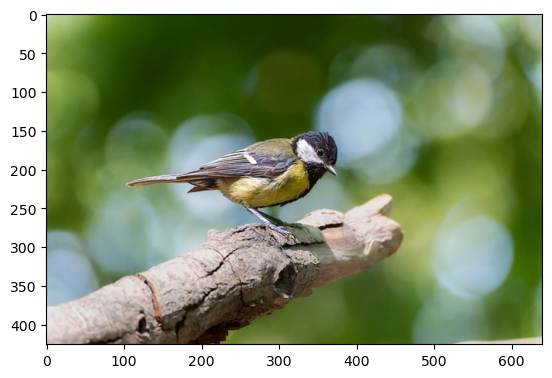

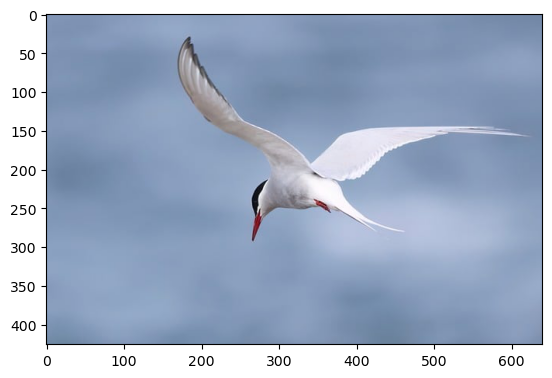

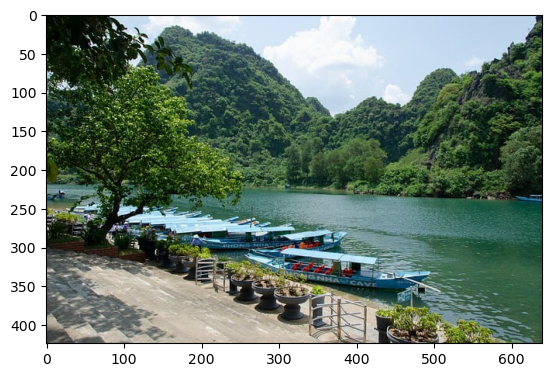

In [240]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import warnings

warnings.filterwarnings("ignore")

img1 = np.asarray(io.imread("images\\img1.jpg"))
img2 = np.asarray(io.imread("images\\img2.jpg"))
img3 = np.asarray(io.imread("images\\img3.jpg"))

plt.imshow(img1)
plt.show()
plt.imshow(img2)
plt.show()
plt.imshow(img3)
plt.show()

Compression with PCA

In [241]:
class PCACompression:
    def transform(image, n_components):
        # transfrom function - transforms image to compressed form in this case compressed by PCA
        # arguments of this function are:
        #   image - 3D(width,height,channel) array of image
        #   n_components - Count of PC, which are stored
        compressed_data = []

        # loop to make PCA on all channels (R,G,B)
        for i in range(image.shape[2]):
            column_mean = np.mean(
                image[:, :, i], axis=0
            )  # calculating means for all columns
            image_centered = (
                image[:, :, i] - column_mean
            )  # cenetring data by subtacting mean
            cov = np.cov(image_centered.T)  # calculating covariance matrix

            U, S, Vt = np.linalg.svd(cov)  # SVD to get singular values and eigenvectors
            image_tranformed = (
                image_centered[:, :] @ U[:, :n_components]
            )  # transform to n_components of PCs
            compressed_data.append(
                (image_tranformed, U[:, :n_components], column_mean)
            )  # storing transformed_image n_components eigenvectors from U matrix and mean_column to can make inverse transform

        return compressed_data  # return compressed data

    def inverse_transform(compressed_data):
        # inverse_transfrom function - transforms compressed data to image
        # argument of this function is:
        #   compressed_data - data returned by transform function
        image = []

        # loop of all color channels (r,g,b)
        for channel in compressed_data:
            inversed = (
                channel[0] @ channel[1].T + channel[2]
            )  # inverse transform by multiplying data of image in lower dimensionality and eigenvectors and adding mean
            image.append(inversed)
        image = np.transpose(
            image, (1, 2, 0)
        )  # transposing image array to 3-rd dimension be color
        return np.array(image)  # return image array

    def get_commpressed_data_size(compressed_data):
        # get_commpressed_data_size method - calculates size of compressed data
        # argument of this function is:
        #   compressed_data - data returned by transform function
        size = 0
        # loop of all color layers (r,g,b)
        for d in compressed_data:
            size += d[0].size  # size of image in lower dimensionality
            size += d[1].size  # size of eigenvectors needed to inverse matrix
            size += d[2].size  # size of mean vector
        return size  # return calaculated size

In [242]:
from skimage.metrics import structural_similarity, mean_squared_error

df = pd.DataFrame(
    columns=(
        "compression method",
        "image",
        "image size",
        "compressed data size",
        "% compression",
        "MSE",
        "structural_similarity",
    )
)  # create data frame with statistics of compression


def new_record(
    df, compression_method, name_of_image, image, compressed_image, compressed_size
):
    # this function adds record to above created dataframe
    df = df.append(
        {
            "compression method": compression_method,  # method name used to compression
            "image": name_of_image,  # name of compressed image
            "image size": image.size,  # image size
            "compressed data size": compressed_size,  # size of compressed image
            "% compression": compressed_size/ image.size * 100,  # percantage of compression
            "MSE": mean_squared_error(
                compressed_image, image
            ),  # Mean squared error betwwen image from compression and original image
            "structural_similarity": structural_similarity(
                compressed_image, image, channel_axis=2
            ),
        },
        ignore_index=True,
    )  # structural similarity index measure between image from compression and original image
    # structural similarity measure is better than MSE to compare images, because MSE calculates only difference betwwen pixels, when ssim is considering luminance, contrast and structure.
    # When ssim is 1 then images are same.
    return df


images_to_compress = [("img1", img1), ("img2", img2), ("img3", img3)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


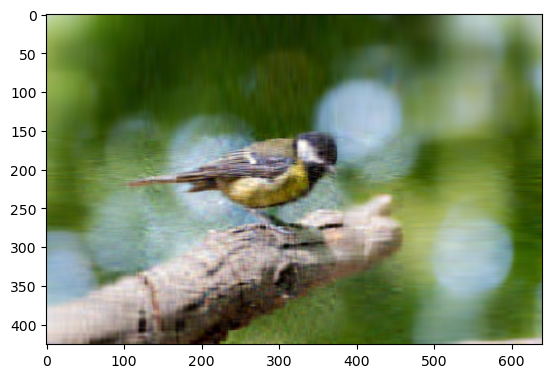

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


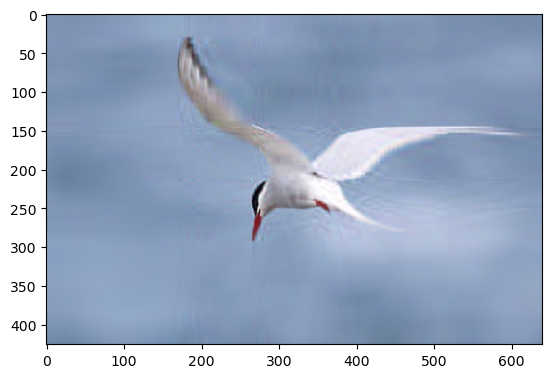

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


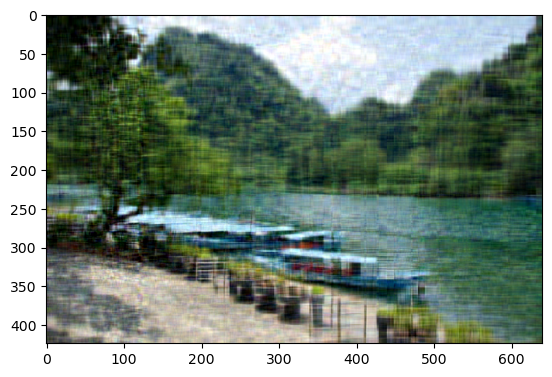

In [243]:
# transform to compression form and inverse transform images from images_to_compress list and calculate statistics
for image in images_to_compress:
    cd = PCACompression.transform(
        image[1], int(image[1].shape[0] * 0.06)
    )  # transform by PCA
    compressed_image = PCACompression.inverse_transform(
        cd
    )  # inverse transform from cd - compress data
    plt.imshow(compressed_image / 255)
    plt.show()  # showing image from compression
    df = new_record(
        df,
        "PCA",
        image[0],
        image[1],
        compressed_image,
        PCACompression.get_commpressed_data_size(cd),
    )  # add statistics to df

Compression by Canonical Polyadic Decomposition

In [244]:
import tensorly as tl


class CPDCompression:
    def transform(image, rank):
        # rank - rank of Canonical polyadic decomposition
        image_tensor = tl.tensor(
            image, dtype="float64"
        )  # creating tensor of image array
        compressed_data = tl.decomposition.parafac(
            image_tensor, rank, init="random"
        )  # CPD of image tensor with rank specified by user
        return compressed_data  # returned decomposition factors

    def inverse_transform(compressed_data):
        image = tl.cp_to_tensor(
            compressed_data
        )  # calculating image from decomposition factors
        return np.array(image)

    def get_commpressed_data_size(compressed_data):
        size = 0
        for factor in compressed_data.factors:
            size += factor.size
        size += compressed_data.weights.size
        # size is sum of factors and weights arrays sizes
        return size

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


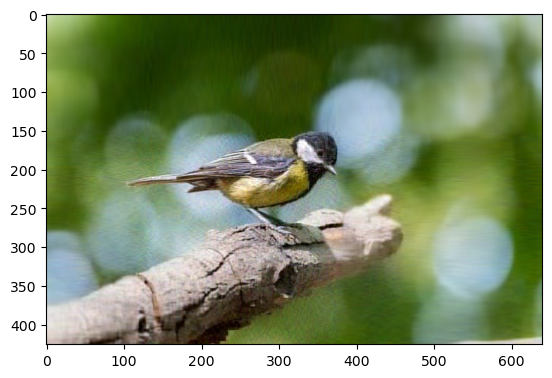

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


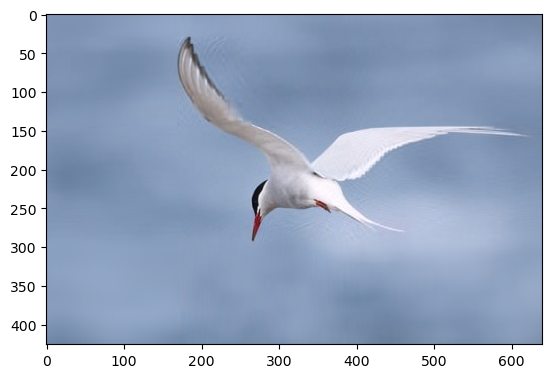

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


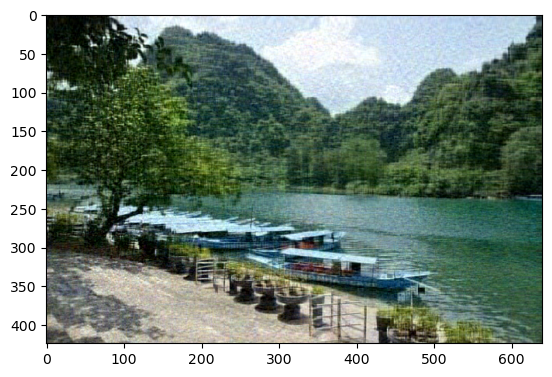

In [245]:
# compression images by CPDCompression
for image in images_to_compress:
    cd = CPDCompression.transform(image[1], int(image[1].shape[1] * 0.12))
    compressed_image = CPDCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.show()
    df = new_record(
        df,
        "CPD",
        image[0],
        image[1],
        compressed_image,
        CPDCompression.get_commpressed_data_size(cd),
    )

Compression by Tucker Decomposition

In [246]:
class TuckerCompression:
    def transform(image, rank):
        # rank - rank of Tucker decomposition (shape of core)
        image_tensor = tl.tensor(
            image, dtype="float64"
        )  # creating tensor from image array
        compressed_data = tl.decomposition.tucker(
            image_tensor, rank, init="random"
        )  # tucker decomposition
        return compressed_data

    def inverse_transform(compressed_data):
        image = tl.tucker_to_tensor(
            compressed_data
        )  # calculating image array form tucker decomposition factors
        return np.array(image)

    def get_commpressed_data_size(compressed_data):
        size = 0
        for factor in compressed_data.factors:
            size += factor.size
        size += compressed_data.core.size
        # size of compressed_data is sum of size of all factors and size of core
        return size

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


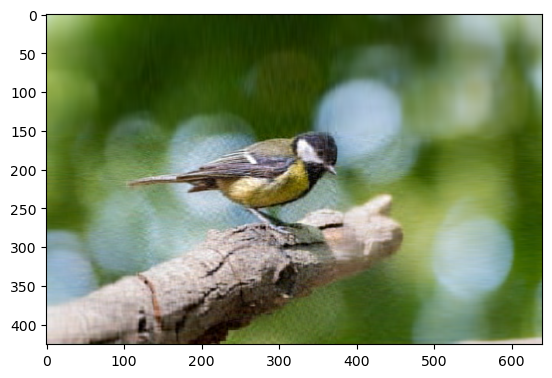

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


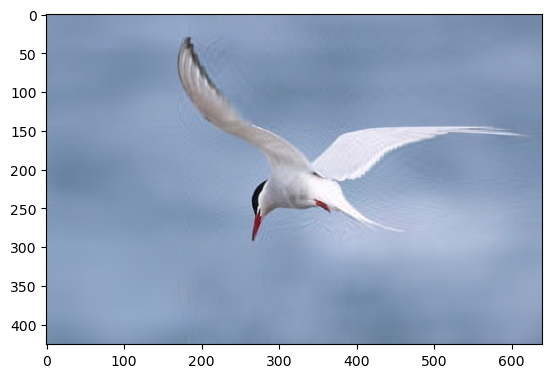

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


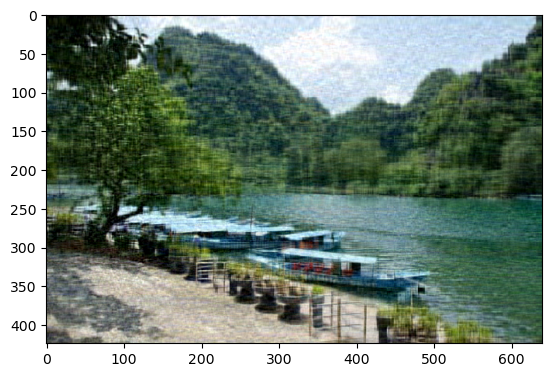

In [247]:
# compression images by TuckerCompression
for image in images_to_compress:
    cd = TuckerCompression.transform(
        image[1], [int(image[1].shape[0] * 0.12), int(image[1].shape[1] * 0.12), 3]
    )
    compressed_image = TuckerCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.show()
    df = new_record(
        df,
        "Tucker",
        image[0],
        image[1],
        compressed_image,
        TuckerCompression.get_commpressed_data_size(cd),
    )

Compression by Fourier Transform

In [248]:
import scipy.sparse as sp


class FourierTransformCompression:
    def tresholding(coeffs, treshold_ratio):
        # treshholding method - filters/removes (converts to zeros) coefficients from coeffs array which are lower or equal than treshhold
        # arguments of this function are:
        #   coeffs - array of coefficients from fft of image
        #   treshold_ratio - specifies how much of coefficients will be not deleted
        Csort = np.sort(np.abs(coeffs.reshape(-1)))  # sort absolute values of coeffs
        thresh = Csort[
            int(np.floor((1 - treshold_ratio) * len(Csort)))
        ]  # the highest coefficent which will be deleted
        ind = (
            np.abs(coeffs) > thresh
        )  # creating array of 1 and 0, which specified, which values will be or not be deleted, by comparing whether coefficient is greater than treshold
        filtered_coeffs = (
            coeffs * ind
        )  # zeroing values ​​less than or equal to the threshold value
        return filtered_coeffs  # return filitered coefficients

    def to_sparse_matrix(matrix):
        # to_sparse_matrix method - converts matrix to csr form of sparse matrix
        return sp.csr_matrix(matrix)

    def from_sparse_matrix(sparse_matrix):
        # from_sparse_matrix method - converts csr form of sparse matrix to ordinary matrix
        return sparse_matrix.toarray()

    def transform(image, compression_ratio):
        # compression_ratio - specify which part of coefficients will be held
        compressed_data = []
        # loop of all color channels
        for i in range(image.shape[2]):
            f = np.fft.fft2(image[:, :, i])  # calculate fft of one channel of image
            filtered_f = FourierTransformCompression.tresholding(
                f, compression_ratio
            )  # tresholding coefficients of fft
            compressed_data.append(
                FourierTransformCompression.to_sparse_matrix(filtered_f)
            )  # changing matrix to sparse matrix form and storing compressed data
            # this method not changes data to lower dimensions, but removes not important coefficients of frequency domain by tresholding
            # So size of data is still same, but have lots of zeros, thus to compress we can save data as sparse matrix
        return compressed_data  # return compressed data (sparse matrix)

    def inverse_transform(compressed_data):
        image = []
        for channel in compressed_data:
            f = FourierTransformCompression.from_sparse_matrix(
                channel
            )  # converting sparse matrix to ordinary matrix
            inversed = np.fft.ifft2(f).real  # inverse fft and get only real values
            image.append(inversed)
        image = np.transpose(image, (1, 2, 0))  # transposing array to correct form
        return np.array(image)

    def get_commpressed_data_size(compressed_data):
        size = 0
        for channel in compressed_data:
            size += channel.data.size + channel.indptr.size + channel.indices.size
        # size of compressed_data is size of sparse matrix
        return size

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


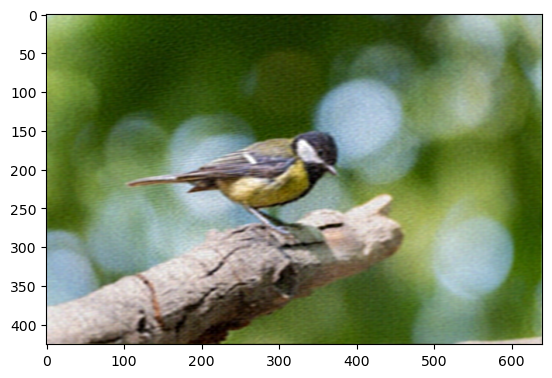

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


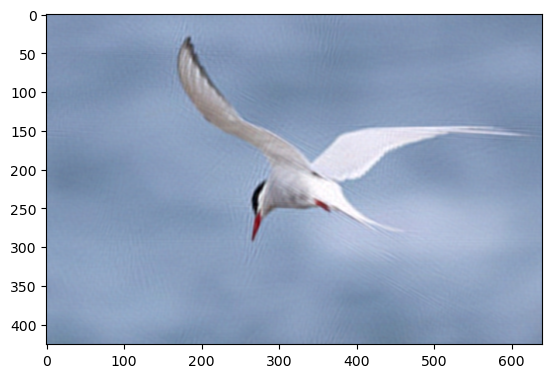

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


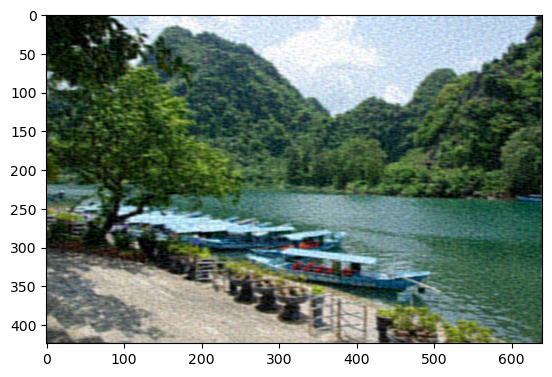

In [249]:
# compression images by FourierTransformCompression
for image in images_to_compress:
    cd = FourierTransformCompression.transform(image[1], 0.05)
    compressed_image = FourierTransformCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.show()
    df = new_record(
        df,
        "Fourier Transform",
        image[0],
        image[1],
        compressed_image,
        FourierTransformCompression.get_commpressed_data_size(cd),
    )

Compression by Wavelet Transform 

In [250]:
import pywt
import sys


class WaveletTransformCompression:
    def tresholding(coeff_array, tresholding_ratio):
        Csort = np.sort(np.abs(coeff_array.reshape(-1)))
        thresh = Csort[int(np.floor((1 - tresholding_ratio) * len(Csort)))]
        ind = np.abs(coeff_array) > thresh
        filtered_coeffs = coeff_array * ind

        return filtered_coeffs

    def to_sparse_matrix(matrix):
        return sp.csr_matrix(matrix)

    def from_sparse_matrix(sparse_matrix):
        return sparse_matrix.toarray()

    def transform(image, compression_ratio, level=None, wavelet="haar"):
        # level - level of discrete wavelete transform decomposition
        # wavelet - name of wavelet
        compressed_data = []
        for i in range(image.shape[2]):
            coeffs = pywt.wavedec2(
                image[:, :, i], wavelet=wavelet, level=level
            )  # calculating Multilevel wavelet transform of image with level and wavelet specified by user
            coeff_arr, coeff_slices = pywt.coeffs_to_array(
                coeffs
            )  # change structure of coeffs to coeffs array and coeffs slices, which specifies how should be dvided coefficients to structure
            filtered_coeffs = WaveletTransformCompression.tresholding(
                coeff_arr, compression_ratio
            )  # thresholding coefficients
            compressed_data.append(
                (
                    WaveletTransformCompression.to_sparse_matrix(filtered_coeffs),
                    coeff_slices,
                )
            )  # storing sparse filtered coefficients matrix and coeffs slices
        return compressed_data

    def inverse_transform(compressed_data, wavelet="haar"):
        # wavelet - name of wavelet used to inverse transorm
        image = []
        for channel in compressed_data:
            coeff_arr = WaveletTransformCompression.from_sparse_matrix(
                channel[0]
            )  # converting data to ordinary matrix
            coeffs = pywt.array_to_coeffs(
                coeff_arr, channel[1], output_format="wavedec2"
            )  # creating structure of coefficients from coefficients array (coeff_arr) and slices (layer[1])
            inversed = pywt.waverec2(
                coeffs, wavelet=wavelet
            )  # calculating inversed transform wavelet
            image.append(inversed)
        image = np.transpose(image, (1, 2, 0))  # transpose to correct format
        return np.array(image)

    def get_commpressed_data_size(compressed_data):
        size = 0
        for channel in compressed_data:
            size += (
                channel[0].data.size + channel[0].indptr.size + channel[0].indices.size
            )
        # size of compressed_data is size of sparse matrix
        return size

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


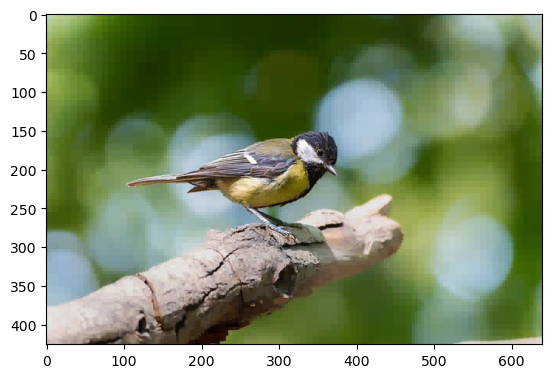

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


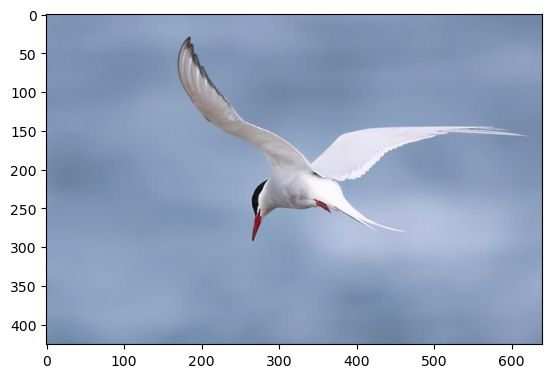

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


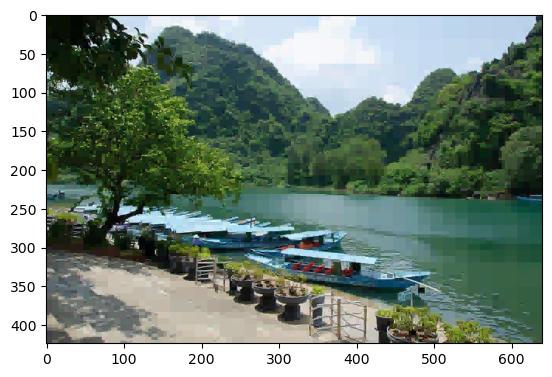

In [251]:
# compression images by FourierTransformCompression
for image in images_to_compress:
    cd = WaveletTransformCompression.transform(image[1], 0.05)
    compressed_image = WaveletTransformCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.show()
    df = new_record(
        df,
        "Wavelet Transform",
        image[0],
        image[1],
        compressed_image,
        WaveletTransformCompression.get_commpressed_data_size(cd),
    )

Dataframe with statistics of compression to 10% of original size

In [252]:
df

,compression method,image,image size,compressed data size,% compression,MSE,structural_similarity
0,PCA,img1,817920,81870,10.009536,104.557670,0.530318
1,PCA,img2,817920,81870,10.009536,17.659781,0.540943
2,PCA,img3,814080,81720,10.038325,541.425513,0.333292
3,CPD,img1,817920,81320,9.942293,31.908715,0.645132
4,CPD,img2,817920,81320,9.942293,4.469365,0.637786
5,CPD,img3,814080,81168,9.970519,266.434055,0.575033
6,Tucker,img1,817920,82003,10.025797,46.912315,0.612291
7,Tucker,img2,817920,82003,10.025797,7.208438,0.602605
8,Tucker,img3,814080,81249,9.980469,368.101901,0.472157
9,Fourier Transform,img1,817920,83067,10.155883,67.649098,0.498679


### Comparing result compression with different size of compression 

PCA compression

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


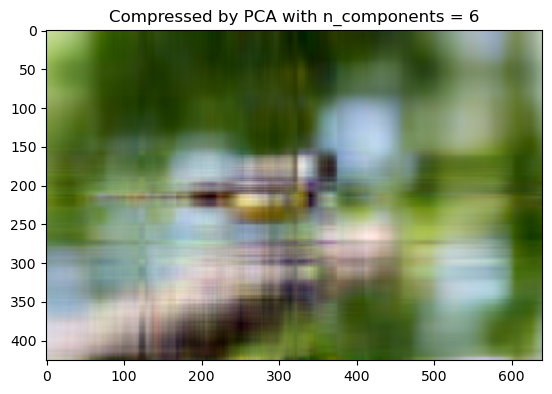

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


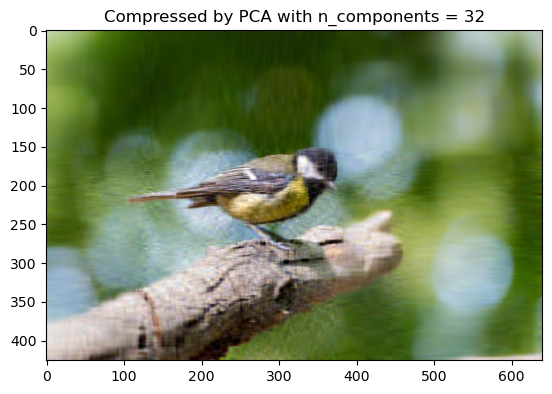

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


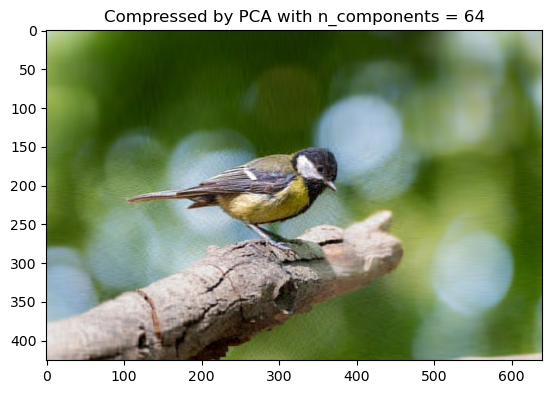

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


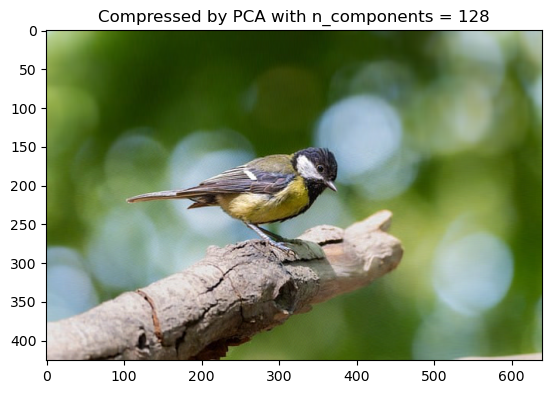

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


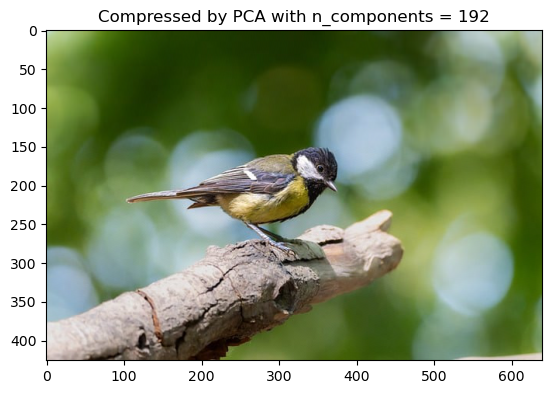

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


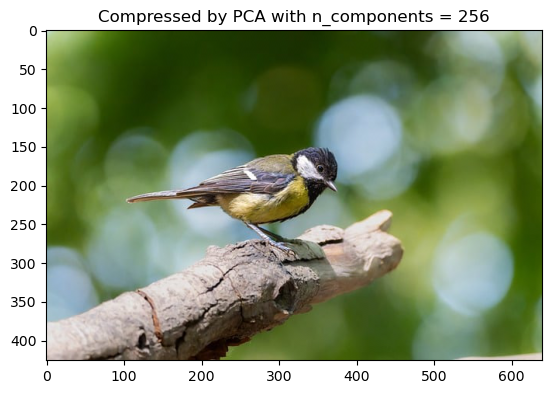

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


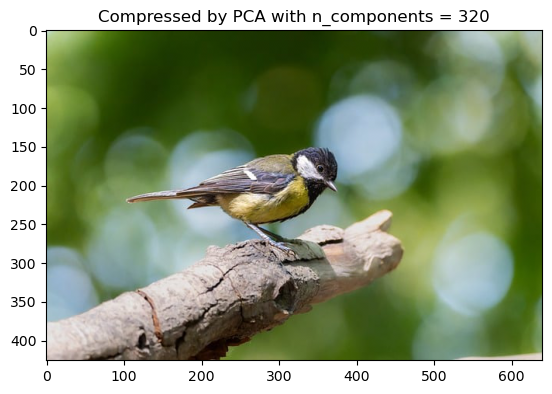

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


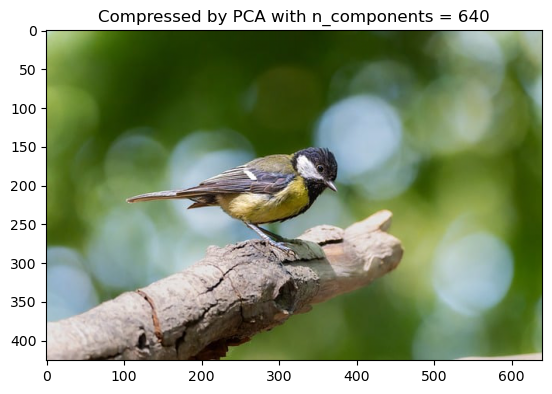

In [210]:
compression_ratio_list = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1]
dfpca = pd.DataFrame(
    columns=(
        "compression method",
        "image",
        "image size",
        "compressed data size",
        "% compression",
        "MSE",
        "structural_similarity",
    )
)
for compression_ratio in compression_ratio_list:
    n_components = int(img1.shape[1] * compression_ratio)
    cd = PCACompression.transform(
        img1, n_components
    )  # transform data with different count of n_components
    compressed_image = PCACompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.title(f"Compressed by PCA with n_components = {n_components}")
    plt.show()  # showing image from compressed data
    dfpca = new_record(
        dfpca,
        "PCA",
        "img1",
        img1,
        compressed_image,
        PCACompression.get_commpressed_data_size(cd),
    )  # saving statistics of this compression

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


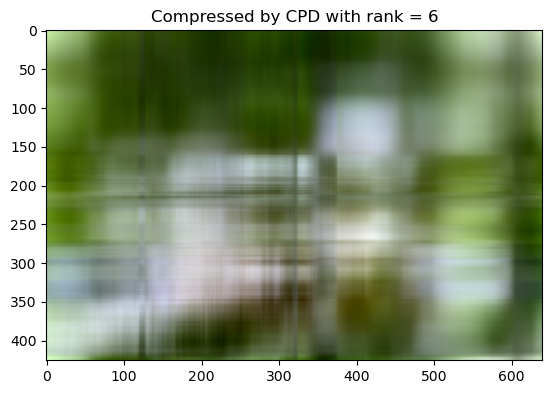

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


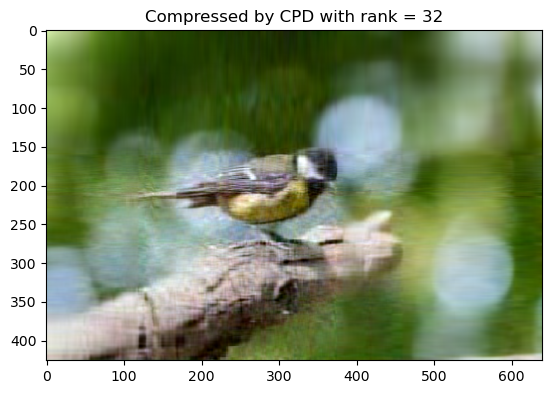

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


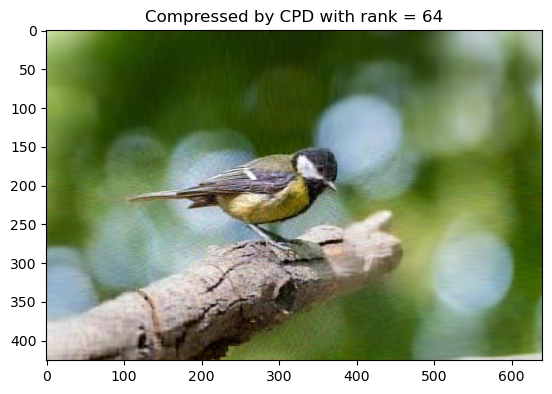

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


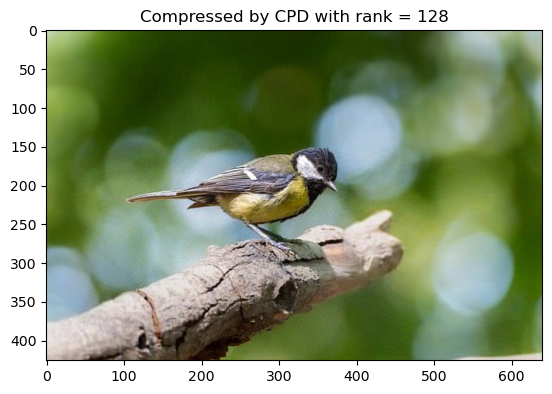

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


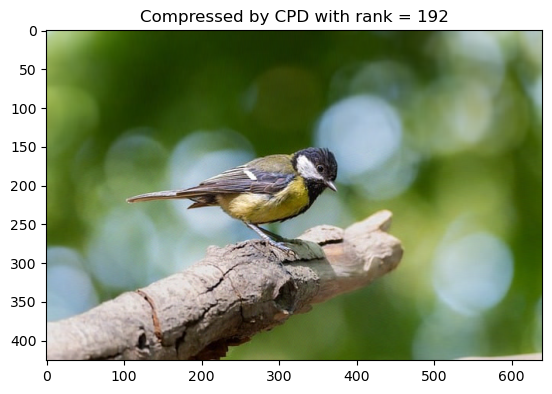

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


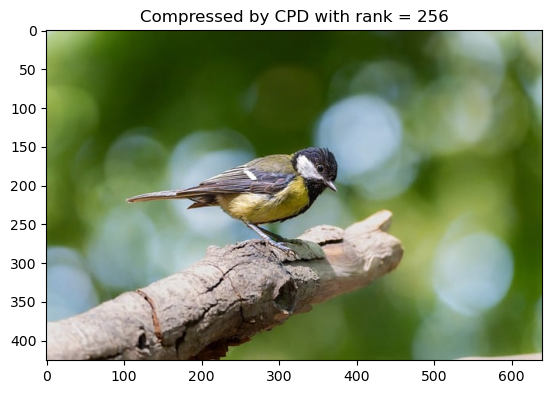

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


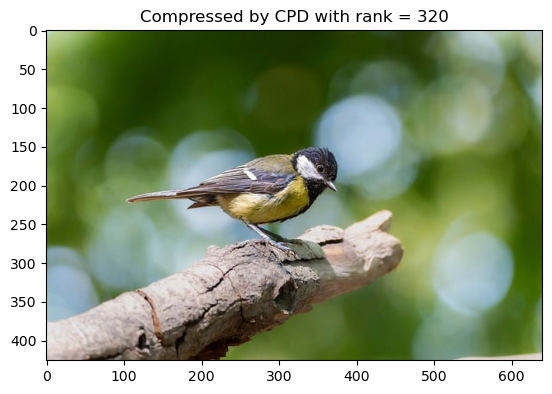

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


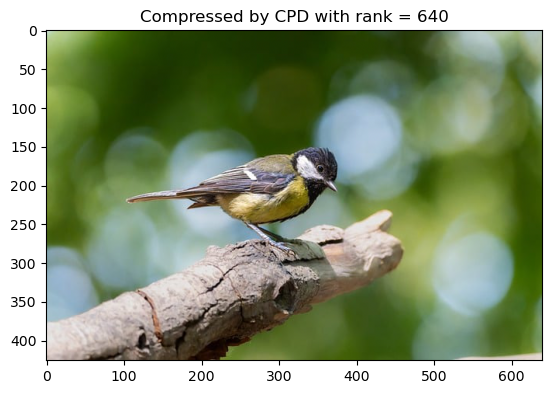

In [211]:
compression_ratio_list = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1]
dfcpd = pd.DataFrame(
    columns=(
        "compression method",
        "image",
        "image size",
        "compressed data size",
        "% compression",
        "MSE",
        "structural_similarity",
    )
)
for compression_ratio in compression_ratio_list:
    rank = int(img1.shape[1] * compression_ratio)
    cd = CPDCompression.transform(img1, rank)  # transform data with different rank
    compressed_image = CPDCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.title(f"Compressed by CPD with rank = {rank}")
    plt.show()
    dfcpd = new_record(
        dfcpd,
        "CPD",
        "img1",
        img1,
        compressed_image,
        CPDCompression.get_commpressed_data_size(cd),
    )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


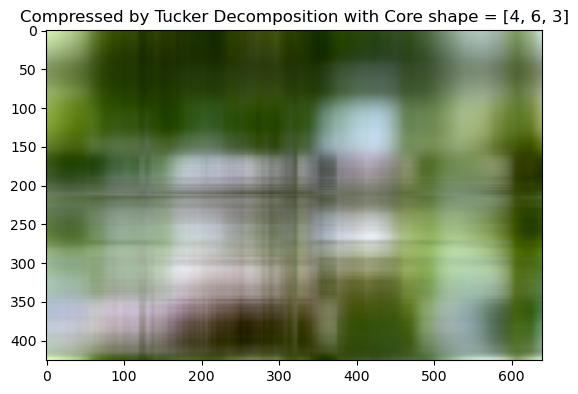

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


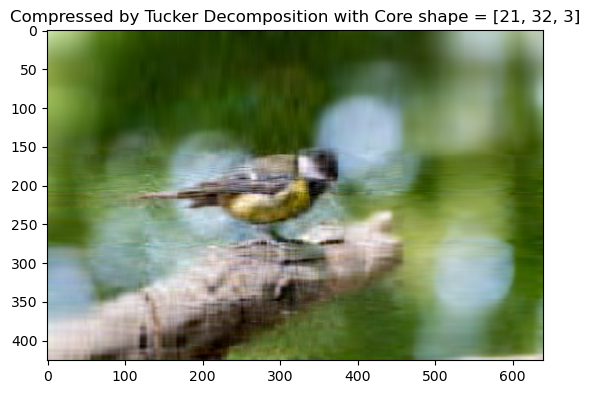

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


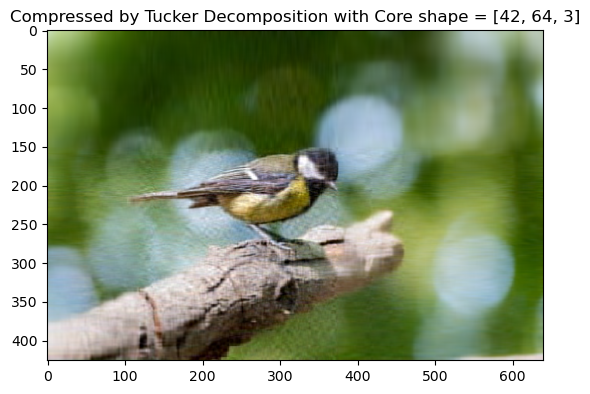

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


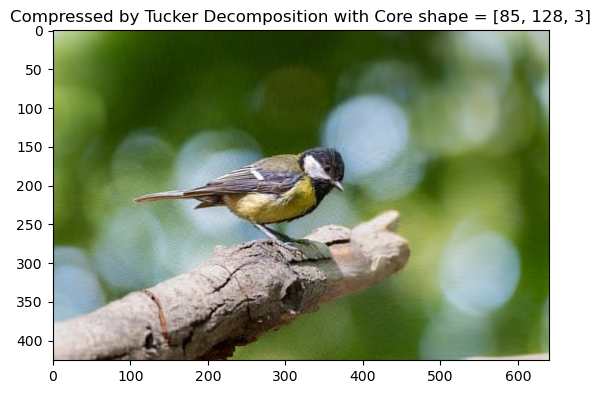

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


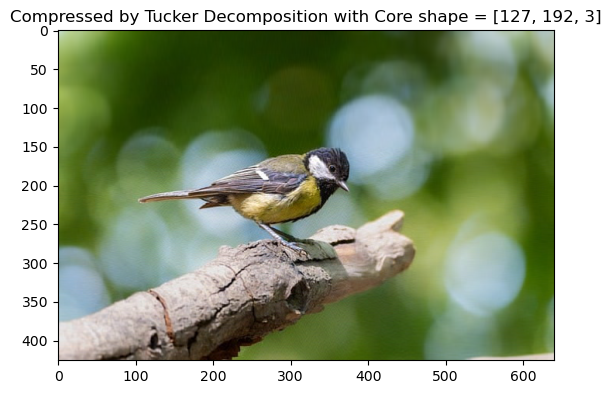

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


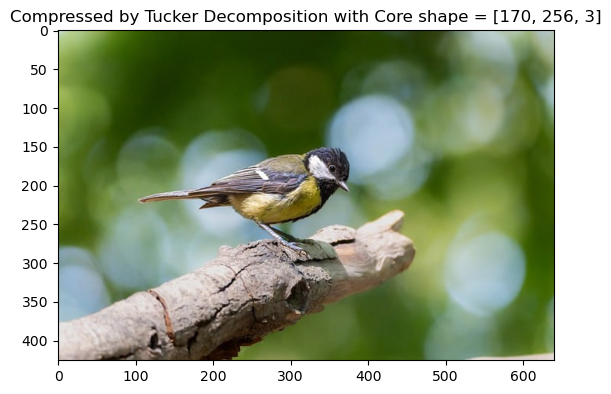

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


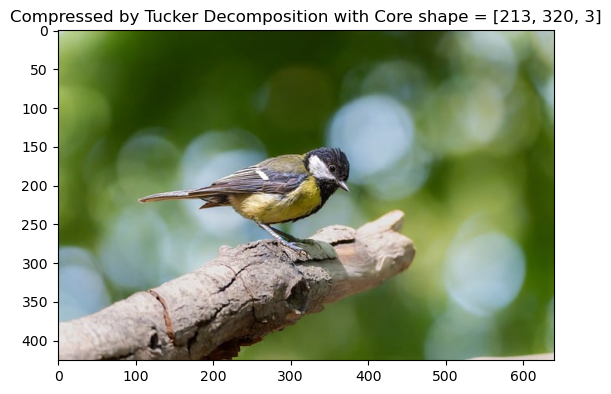

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


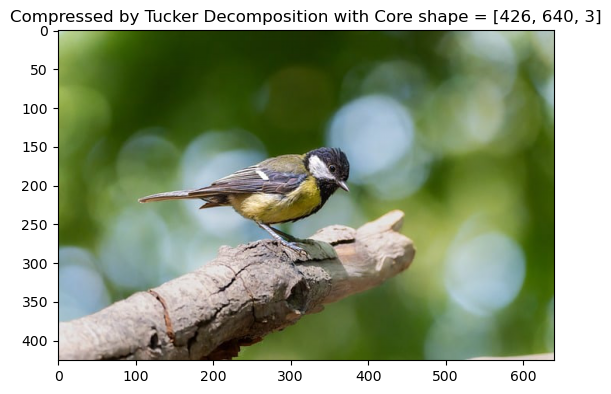

In [212]:
compression_ratio_list = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1]
dftucker = pd.DataFrame(
    columns=(
        "compression method",
        "image",
        "image size",
        "compressed data size",
        "% compression",
        "MSE",
        "structural_similarity",
    )
)
for compression_ratio in compression_ratio_list:
    rank = [
        int(img1.shape[0] * compression_ratio),
        int(img1.shape[1] * compression_ratio),
        3,
    ]
    cd = TuckerCompression.transform(
        img1,
        [
            int(img1.shape[0] * compression_ratio),
            int(img1.shape[1] * compression_ratio),
            3,
        ],
    )  # transform data with different shape of core
    compressed_image = TuckerCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.title(f"Compressed by Tucker Decomposition with Core shape = {rank}")
    plt.show()
    dftucker = new_record(
        dftucker,
        "Tucker",
        "img1",
        img1,
        compressed_image,
        TuckerCompression.get_commpressed_data_size(cd),
    )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


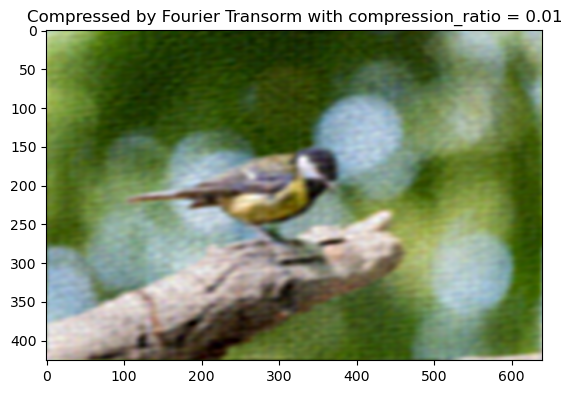

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


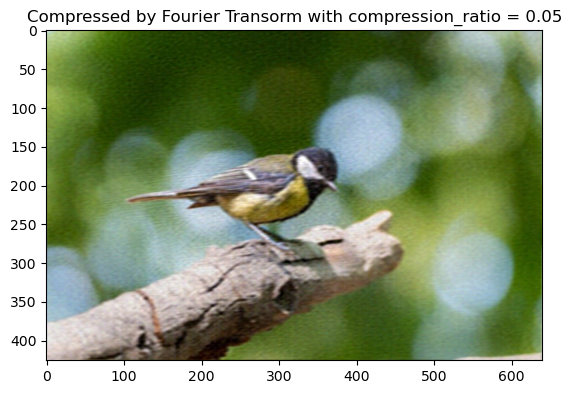

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


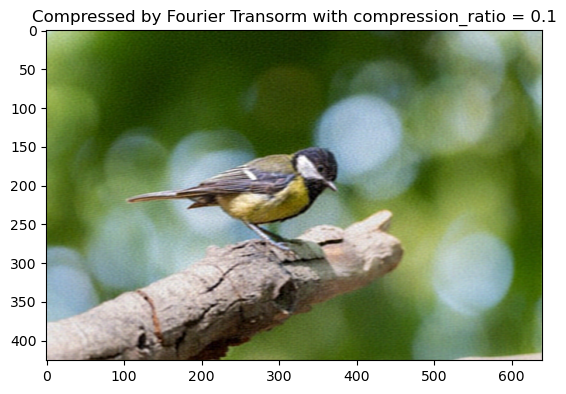

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


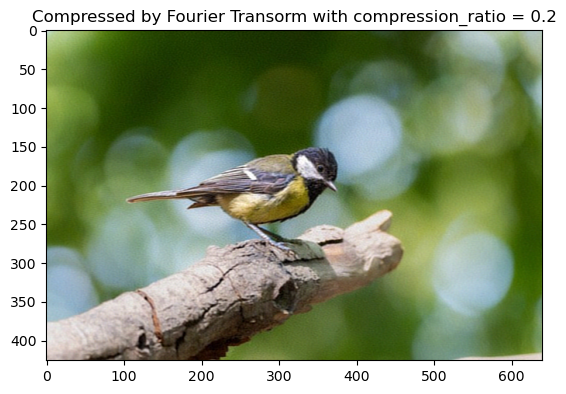

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


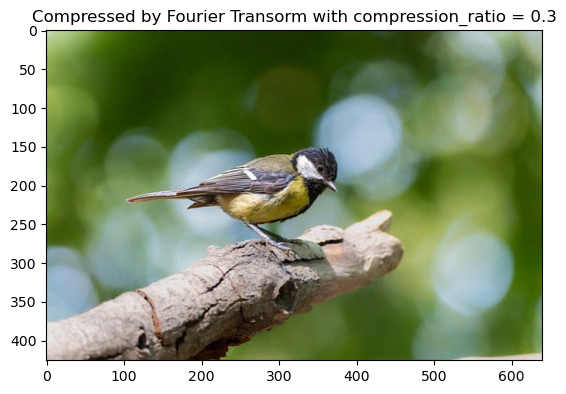

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


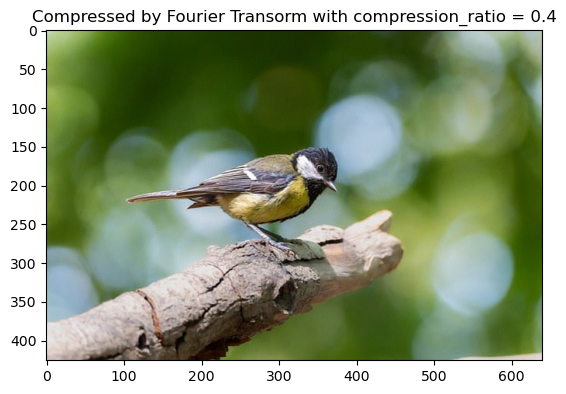

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


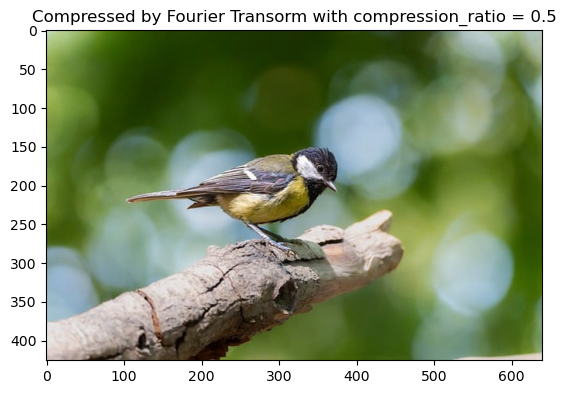

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


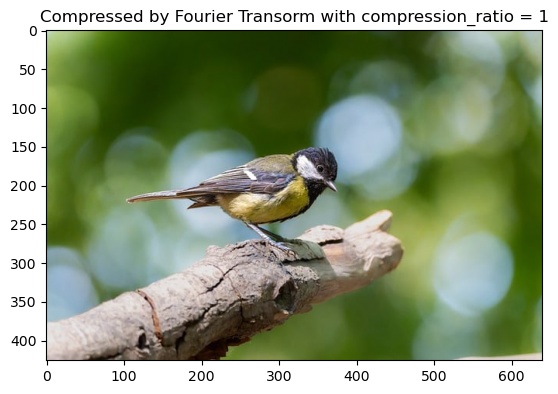

In [213]:
compression_ratio_list = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1]
dffourier = pd.DataFrame(
    columns=(
        "compression method",
        "image",
        "image size",
        "compressed data size",
        "% compression",
        "MSE",
        "structural_similarity",
    )
)
for compression_ratio in compression_ratio_list:
    cd = FourierTransformCompression.transform(
        img1, compression_ratio
    )  # transform data with different count of stored coefficients
    compressed_image = FourierTransformCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.title(
        f"Compressed by Fourier Transorm with compression_ratio = {compression_ratio}"
    )
    plt.show()
    dffourier = new_record(
        dffourier,
        "Fourier Transform",
        "img1",
        img1,
        compressed_image,
        FourierTransformCompression.get_commpressed_data_size(cd),
    )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


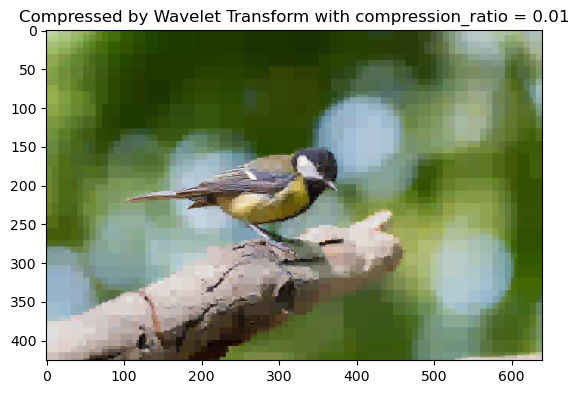

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


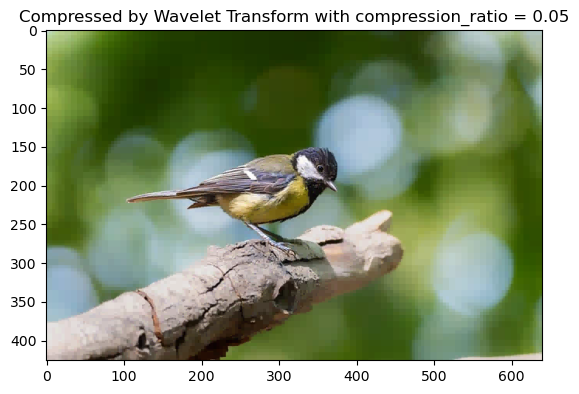

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


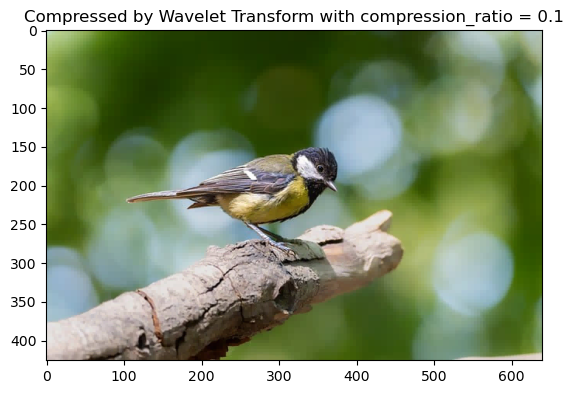

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


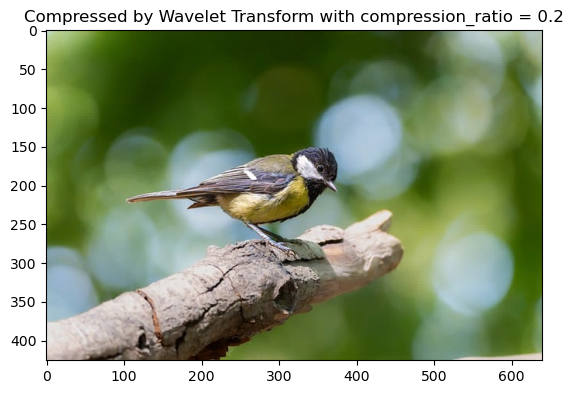

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


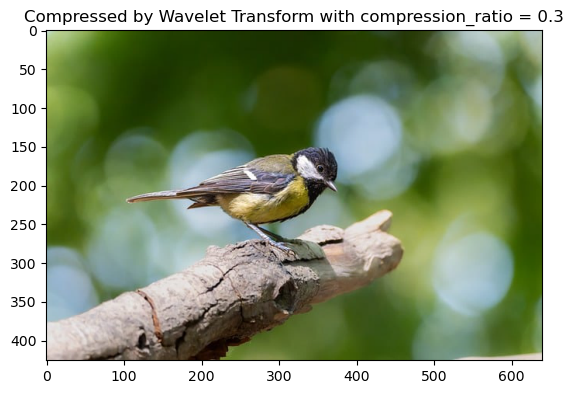

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


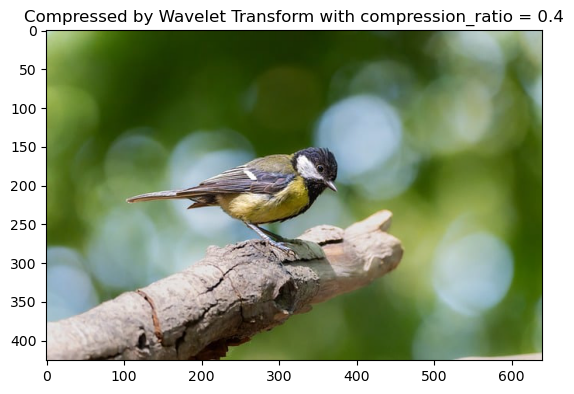

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


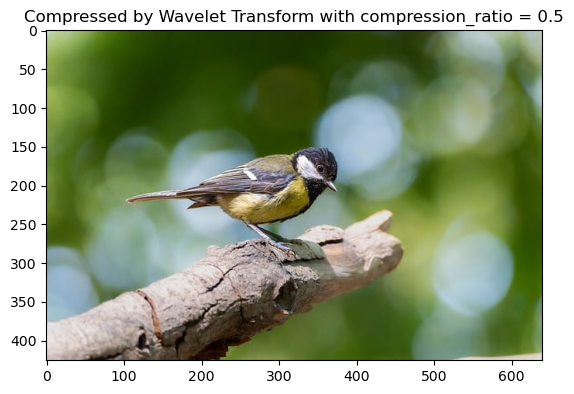

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


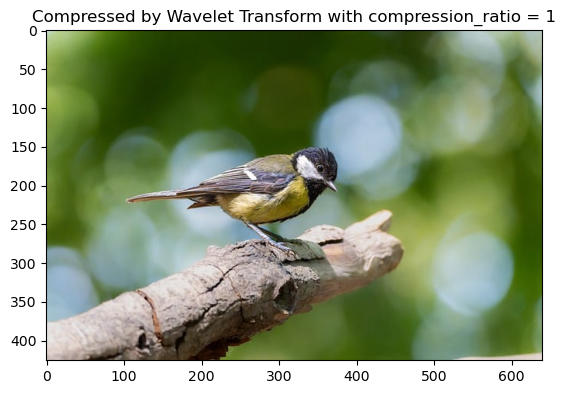

In [214]:
compression_ratio_list = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1]
dfwavelet = pd.DataFrame(
    columns=(
        "compression method",
        "image",
        "image size",
        "compressed data size",
        "% compression",
        "MSE",
        "structural_similarity",
    )
)
for compression_ratio in compression_ratio_list:
    cd = WaveletTransformCompression.transform(
        img1, compression_ratio
    )  # transform data with different count of stored coefficients
    compressed_image = WaveletTransformCompression.inverse_transform(cd)
    plt.imshow(compressed_image / 255)
    plt.title(
        f"Compressed by Wavelet Transform with compression_ratio = {compression_ratio}"
    )
    plt.show()
    dfwavelet = new_record(
        dfwavelet,
        "Wavelet Transform",
        "img1",
        img1,
        compressed_image,
        WaveletTransformCompression.get_commpressed_data_size(cd),
    )

Compare all method of compression on chart

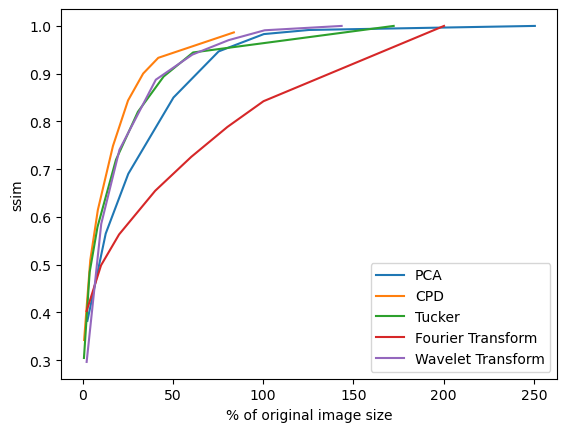

In [215]:
dfs = [dfpca, dfcpd, dftucker, dffourier, dfwavelet]
for df in dfs:
    plt.plot(
        df["% compression"],
        df["structural_similarity"],
        label=df["compression method"][0],
    )
plt.legend()
plt.ylabel("ssim")
plt.xlabel("% of original image size")
plt.show()

On the chart we can see that CPD and is the best compression Tucker Decomposition and Wavelet have also great results. Comprossion with Fourier Transform is worst, but for very low compression_ratio has good results.